In [1]:
from optparse import OptionParser
import json
import os
import pickle
import random
import re
import pandas as pd
import pysam
# import h5py
import numpy as np

import tensorflow as tf
from basenji import seqnn, stream

from akita_utils.seq_gens import central_permutation_seqs_gen
from akita_utils.h5_utils import (initialize_stat_output_h5, write_stat_metrics_to_h5)
from akita_utils.utils import split_df_equally

2024-05-28 11:40:55.790321: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-28 11:40:55.790390: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-28 11:40:55.791203: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-05-28 11:40:55.797000: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-28 11:40:56.923452: W tensorflow/compiler/tf2

In [2]:
from akita_utils.dna_utils import hot1_rc, dna_1hot
from akita_utils.dna_utils import permute_seq_k

In [3]:
# parameters
genome_fasta = "/project/fudenber_735/genomes/mm10/mm10.fa"
out_dir = "./"
rc = False
stats = "SCD"
shifts = "0"

In [4]:
targets_file = None

In [5]:
batch_size = 4

In [6]:
models_dir = "/project/fudenber_735/tensorflow_models/akita/v2/models"

In [7]:
model_index = 0
head_index = 1 #mouse
# head_index = 0 #human

In [8]:
params_file = models_dir + f"/f{model_index}c0/train/params.json"

In [9]:
params_file

'/project/fudenber_735/tensorflow_models/akita/v2/models/f0c0/train/params.json'

In [10]:
model_file = models_dir + f"/f{model_index}c0/train/" + f"model{head_index}_best.h5"

In [11]:
model_file

'/project/fudenber_735/tensorflow_models/akita/v2/models/f0c0/train/model1_best.h5'

In [12]:
# tsv_file = "./chr1_2windows_human_selected.tsv"
tsv_file = "./chr1_2windows_mouse_selected.tsv"

In [13]:
chrom_sizes = "/project/fudenber_735/genomes/mm10/mm10.fa.sizes"

In [14]:
shifts = [int(shift) for shift in shifts.split(",")]
stats = stats.split(",")

chrom_sizes_table = pd.read_csv(chrom_sizes, sep="\t", names=["chrom", "size"])

random.seed(44)

In [15]:
# read model parameters
with open(params_file) as params_open:
    params = json.load(params_open)
params_train = params["train"]
params_model = params["model"]

if batch_size is None:
    batch_size = params_train["batch_size"]
else:
    batch_size = batch_size

In [16]:
# load model
seqnn_model = seqnn.SeqNN(params_model)
seqnn_model.restore(model_file, head_i=head_index)
seqnn_model.build_ensemble(rc, shifts)
seq_length = int(params_model["seq_length"])

# dummy target info
if targets_file is None:
    num_targets = seqnn_model.num_targets()
    target_ids = [ti for ti in range(num_targets)]
    target_labels = [""] * len(target_ids)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 sequence (InputLayer)       [(None, 1310720, 4)]         0         []                            
                                                                                                  
 stochastic_reverse_complem  ((None, 1310720, 4),         0         ['sequence[0][0]']            
 ent (StochasticReverseComp   ())                                                                 
 lement)                                                                                          
                                                                                                  
 stochastic_shift (Stochast  (None, 1310720, 4)           0         ['stochastic_reverse_complemen
 icShift)                                                           t[0][0]']               

In [17]:
seq_coords_df = pd.read_csv(tsv_file, sep="\t")

In [18]:
seq_coords_df

,chr,start,end,perm_start,perm_end,genome_window_start,SCD_h1_m0_t0,genomic_window_id,SCD_h1_m1_t0,SCD_h1_m2_t0,SCD_h1_m3_t0,SCD_h0_m0_t1,SCD_h0_m1_t1,SCD_h0_m2_t1,SCD_h0_m3_t1,mouse_avg_t0,human_avg_t1,mouse_median,human_median
0,chr1,3000320,22433792,5396480,5396684,4743168,0.7270,0,41.1600,0.4646,0.1914,1.1690,0.3413,0.5610,1.2960,10.630,0.8420,0.5957,0.8650
1,chr1,3000320,22433792,6693068,6693272,6039552,50.5300,0,0.8706,0.3860,0.5923,0.5366,0.6626,0.5703,0.8525,13.090,0.6553,0.7314,0.6160
2,chr1,3000320,22433792,9236480,9236684,8583168,0.7183,0,40.4700,1.4060,0.9160,0.2249,0.6080,0.3816,2.3260,10.875,0.8853,1.1610,0.4946
3,chr1,3000320,22433792,13398220,13398424,12744704,44.3400,0,1.1460,1.7500,0.8270,1.5040,0.5396,1.3320,0.7940,12.016,1.0420,1.4480,1.0625
4,chr1,3000320,22433792,14208404,14208608,13553664,0.3360,0,1.0560,42.8000,1.9360,0.5464,0.5825,0.8994,1.1860,11.540,0.8030,1.4960,0.7410


In [19]:
seq_coords_df[["SCD_h1_m0_t0", "SCD_h1_m1_t0", "SCD_h1_m2_t0", "SCD_h1_m3_t0"]]

,SCD_h1_m0_t0,SCD_h1_m1_t0,SCD_h1_m2_t0,SCD_h1_m3_t0
0,0.7270,41.1600,0.4646,0.1914
1,50.5300,0.8706,0.3860,0.5923
2,0.7183,40.4700,1.4060,0.9160
3,44.3400,1.1460,1.7500,0.8270
4,0.3360,1.0560,42.8000,1.9360


In [20]:
seq_coords_df[["SCD_h0_m0_t1", "SCD_h0_m0_t1", "SCD_h0_m2_t1", "SCD_h0_m3_t1"]]

,SCD_h0_m0_t1,SCD_h0_m0_t1,SCD_h0_m2_t1,SCD_h0_m3_t1
0,1.1690,1.1690,0.5610,1.2960
1,0.5366,0.5366,0.5703,0.8525
2,0.2249,0.2249,0.3816,2.3260
3,1.5040,1.5040,1.3320,0.7940
4,0.5464,0.5464,0.8994,1.1860


In [21]:
seq_length

1310720

In [22]:
bin_size = 2048

In [23]:
# splitting into k chunks
split = 10

In [24]:
# open genome FASTA
genome_open = pysam.Fastafile(genome_fasta)

In [25]:
indices = [10*i for i in range(100)]

In [26]:
seq_coords_df = seq_coords_df[["chr", "end", "start", "genome_window_start"]]
# .iloc[indices].reset_index(drop=True)

In [27]:
seq_coords_df

,chr,end,start,genome_window_start
0,chr1,22433792,3000320,4743168
1,chr1,22433792,3000320,6039552
2,chr1,22433792,3000320,8583168
3,chr1,22433792,3000320,12744704
4,chr1,22433792,3000320,13553664


In [28]:
from akita_utils.seq_gens import sliding_disruption_seq_gen

In [ ]:
# def sliding_disruption_seq_gen(seq_coords_df, genome_open, split=10, bin_size=2048, seq_length=1310720):

#     rel_start_permutation_bin = (seq_length // 2) - bin_size
    
#     for s in seq_coords_df.itertuples():
#         list_1hot = []
#         window_start = s.genome_window_start
#         chrom = s.chr
        
#         # wild type
#         wt_seq_1hot = dna_1hot(
#                     genome_open.fetch(chrom, window_start, window_start+seq_length).upper()
#                 )
#         list_1hot.append(wt_seq_1hot)
    
#         for perm_index in range(split):
#             permutation_start = rel_start_permutation_bin + (bin_size // split) * perm_index
#             permutation_end = rel_start_permutation_bin + (bin_size // split) * (perm_index+1)
    
#             alt_seq_1hot = wt_seq_1hot.copy()
#             permuted_span = permute_seq_k(
#                     alt_seq_1hot[permutation_start:permutation_end], k=1
#                 )
#             alt_seq_1hot[permutation_start:permutation_end] = permuted_span
#             list_1hot.append(alt_seq_1hot)
            
#         # yielding first the reference, then the permuted sequence
#         for sequence in list_1hot:
#             yield sequence

In [29]:
seq_coords_df

,chr,end,start,genome_window_start
0,chr1,22433792,3000320,4743168
1,chr1,22433792,3000320,6039552
2,chr1,22433792,3000320,8583168
3,chr1,22433792,3000320,12744704
4,chr1,22433792,3000320,13553664


In [30]:
def expand_seq_coords_df(seq_coords_df, split=10, bin_size=2048, seq_length=1310720):

    rel_start_permutation_bin = (seq_length // 2) - bin_size
    
    # Initialize lists to store the resulting rows
    chr_list = []
    start_list = []
    end_list = []
    genome_window_start_list = []
    perm_start_list = []
    perm_end_list = []

    # Iterate through each row in seq_coords_df
    for row in seq_coords_df.itertuples(index=False):
        for perm_index in range(split):
            permutation_start = rel_start_permutation_bin + (bin_size // split) * perm_index
            permutation_end = rel_start_permutation_bin + (bin_size // split) * (perm_index + 1)
            
            # Append the values to the respective lists
            chr_list.append(row.chr)
            start_list.append(row.start)
            end_list.append(row.end)
            genome_window_start_list.append(row.genome_window_start)
            perm_start_list.append(row.genome_window_start + permutation_start)
            perm_end_list.append(row.genome_window_start + permutation_end)
    
    # Create the resulting DataFrame
    expanded_df = pd.DataFrame({
        'chr': chr_list,
        'start': start_list,
        'end': end_list,
        'genome_window_start': genome_window_start_list,
        'perm_start': perm_start_list,
        'perm_end': perm_end_list
    })

    return expanded_df

In [31]:
expanded_seq_coords_df = expand_seq_coords_df(seq_coords_df)

In [32]:
expanded_seq_coords_df

,chr,start,end,genome_window_start,perm_start,perm_end
0,chr1,3000320,22433792,4743168,5396480,5396684
1,chr1,3000320,22433792,4743168,5396684,5396888
2,chr1,3000320,22433792,4743168,5396888,5397092
3,chr1,3000320,22433792,4743168,5397092,5397296
4,chr1,3000320,22433792,4743168,5397296,5397500
5,chr1,3000320,22433792,4743168,5397500,5397704
6,chr1,3000320,22433792,4743168,5397704,5397908
7,chr1,3000320,22433792,4743168,5397908,5398112
8,chr1,3000320,22433792,4743168,5398112,5398316
9,chr1,3000320,22433792,4743168,5398316,5398520


In [ ]:
# expanded_seq_coords_df.to_csv('chr1_2windows_expanded.tsv', sep="\t", index=False) 

In [33]:
# initialize output
stats_out = initialize_stat_output_h5(out_dir, model_file, stats, expanded_seq_coords_df)

print("stat_h5_outfile initialized")

stat_h5_outfile initialized


In [34]:
preds_stream = stream.PredStreamGen(
        seqnn_model,
        sliding_disruption_seq_gen(seq_coords_df, genome_open=genome_open),
        batch_size,
    )

In [35]:
from akita_utils.stats_utils import calculate_SCD #, plot_map

In [36]:
from akita_utils.utils import ut_dense

In [ ]:
# 0	Hsieh2019_mESC_uC	/home/drk/hic/data/data/coolers/mm10/Hsieh2019/mESC_mm10_4DNFILZ1CPT8.mapq_30.2048.cool	HIC:mESC
# 1	Bonev2017_mESC	/home/drk/hic/data/data/coolers/mm10/Bonev2017/HiC_ES_all.mm10.mapq_30.2048.cool	HIC:mESC
# 2	Bonev2017_CN	/home/drk/hic/data/data/coolers/mm10/Bonev2017/HiC_CN_all.mm10.mapq_30.2048.cool	HIC:cortical neuron
# 3	Bonev2017_ncx_CN	/home/drk/hic/data/data/coolers/mm10/Bonev2017/HiC_ncx_CN_all.mm10.mapq_30.2048.cool	HIC:neocortex cortical neuron
# 4	Bonev2017_NPC	/home/drk/hic/data/data/coolers/mm10/Bonev2017/HiC_NPC_all.mm10.mapq_30.2048.cool	HIC:neural progenitor cell
# 5	Bonev2017_ncx_NPC	/home/drk/hic/data/data/coolers/mm10/Bonev2017/HiC_ncx_NPC_all.mm10.mapq_30.2048.cool	HIC:neocortex neural progenitor cell

In [ ]:
# human
# 0	HFF	../../data/data/coolers/Krietenstein2019/HFF_hg38_4DNFIP5EUOFX.mapq_30.2048.cool	384	sum	HIC:HFF
# 1	H1hESC	../../data/data/coolers/Krietenstein2019/H1hESC_hg38_4DNFI1O6IL1Q.mapq_30.2048.cool	384	sum	HIC:H1hESC
# 2	GM12878	../../data/data/coolers/Rao2014/GM12878_inSitu_MboI_all.hg38.2048.cool	384	sum	HIC:GM12878
# 3	IMR90	../../data/data/coolers/Rao2014/IMR90_inSitu_MboI_all.hg38.2048.cool	384	sum	HIC:IMR90
# 4	HCT116	../../data/data/coolers/Rao2017/Unsynchronized_all.hg38.2048.cool	384	sum	HIC:HCT116

In [37]:
num_preds = len(seq_coords_df) * (split+1)

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_map(matrix, vmin=-0.6, vmax=0.6, width=5, height=5, palette="RdBu_r"):
    """
    Plots a 512x512 log(obs/exp) map with partially transparent red lines at row 255 and column 255.

    Parameters
    ------------
    matrix : numpy array
        Predicted log(obs/exp) map.
    vmin : float
    vmax : float
        Minimum and maximum in the colormap scale.
    width : int
    height : int
        Width and height of a plotted map.
    """

    fig, ax = plt.figure(figsize=(width, height)), plt.gca()

    sns.heatmap(
        matrix,
        vmin=vmin,
        vmax=vmax,
        cbar=False,
        cmap=palette,
        square=True,
        xticklabels=False,
        yticklabels=False,
        ax=ax
    )

    # Add partially transparent red lines at row 255 and column 255
    ax.axhline(y=255, color='red', alpha=0.5, linewidth=2)
    ax.axvline(x=255, color='red', alpha=0.5, linewidth=2)

    plt.show()

In [39]:
num_preds

55

In [40]:
SCD_list = []

REFERENCE
pred_index=  0
8/8 [==============================] - 25s 3s/step


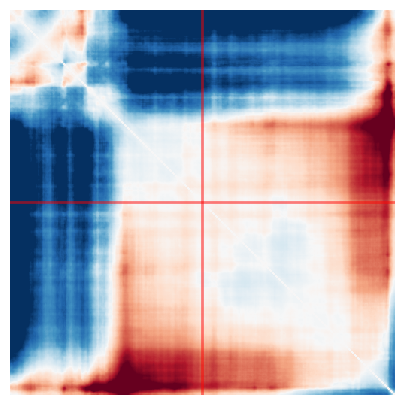

PERMUATION 0
pred_index=  1
exp_index:  0
[0.5059358  0.52384275 0.55255    0.4992315  0.4672936  0.3784798 ]
mean:  0.4878889
[0.5059358  0.52384275 0.55255    0.4992315  0.4672936  0.3784798 ]


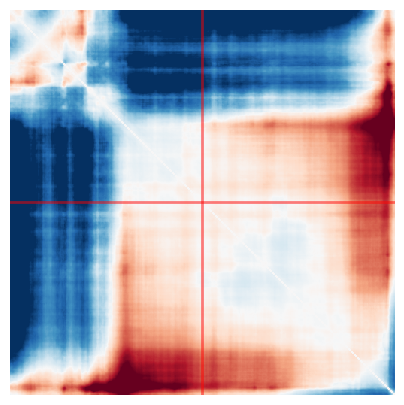

difference map


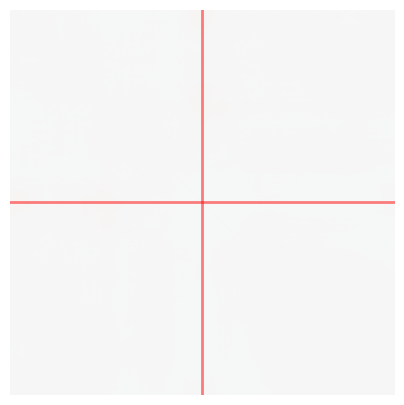

PERMUATION 1
pred_index=  2
exp_index:  1
[0.48175865 0.5335522  0.51003444 0.4590497  0.457795   0.37299567]
mean:  0.4691976
[0.48175865 0.5335522  0.51003444 0.4590497  0.457795   0.37299567]


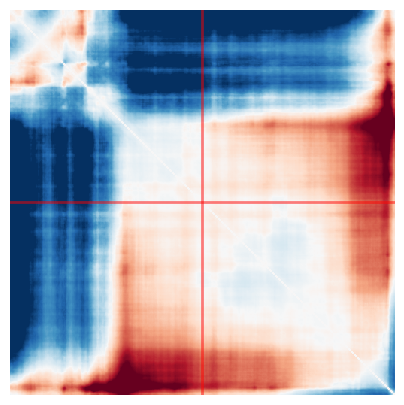

difference map


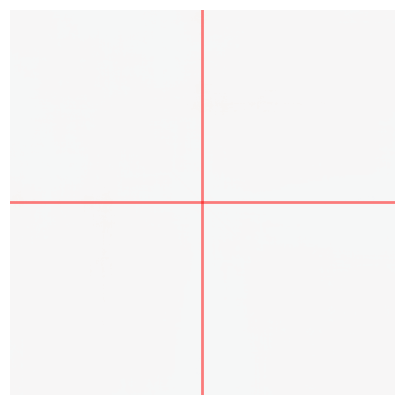

PERMUATION 2
pred_index=  3
exp_index:  2
[0.2687015  0.2466835  0.25185448 0.22035964 0.20175996 0.16806611]
mean:  0.22623754
[0.2687015  0.2466835  0.25185448 0.22035964 0.20175996 0.16806611]


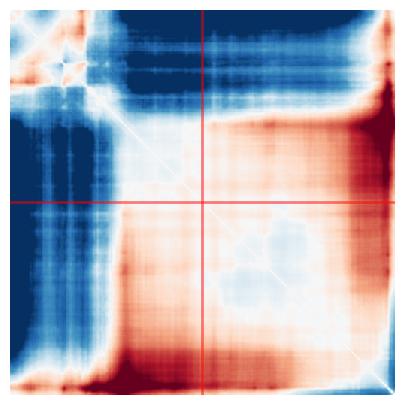

difference map


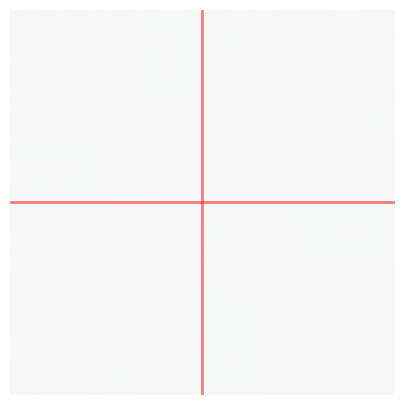

PERMUATION 3
pred_index=  4
exp_index:  3
[0.16503711 0.17171545 0.12721789 0.11400392 0.1247753  0.1005085 ]
mean:  0.13387637
[0.16503711 0.17171545 0.12721789 0.11400392 0.1247753  0.1005085 ]


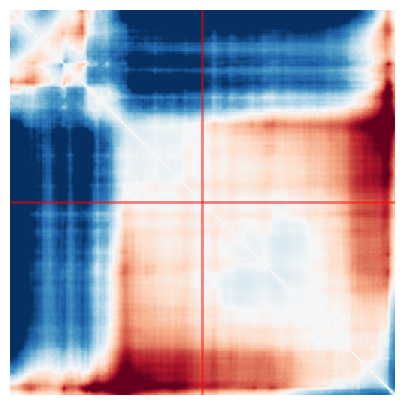

difference map


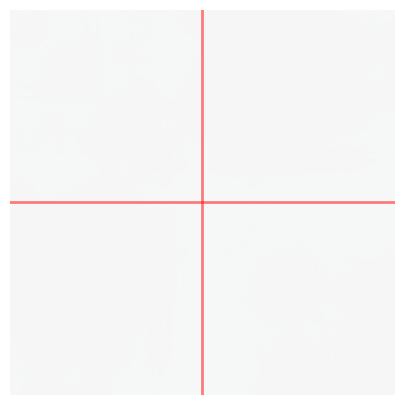

PERMUATION 4
pred_index=  5
exp_index:  4
[0.2937469  0.32873285 0.23229708 0.21968505 0.22173196 0.18280022]
mean:  0.246499
[0.2937469  0.32873285 0.23229708 0.21968505 0.22173196 0.18280022]


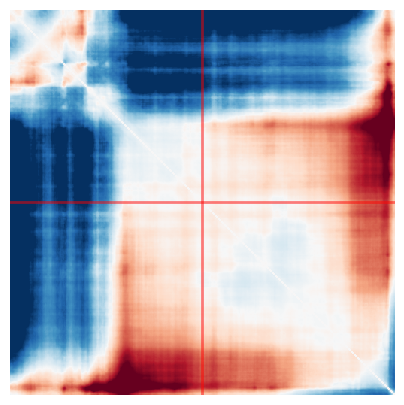

difference map


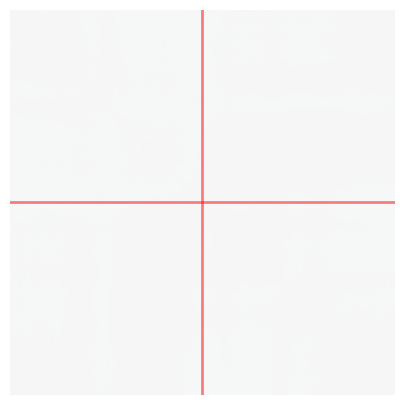

PERMUATION 5
pred_index=  6
exp_index:  5
[0.16620956 0.17310025 0.16097252 0.15003541 0.14320125 0.11833838]
mean:  0.15197624
[0.16620956 0.17310025 0.16097252 0.15003541 0.14320125 0.11833838]


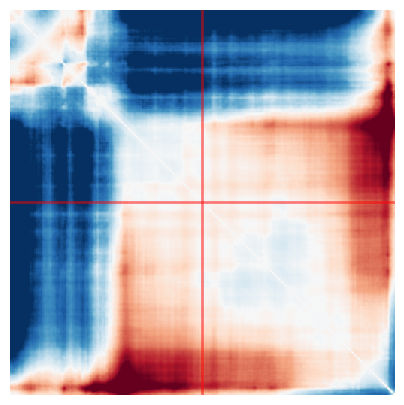

difference map


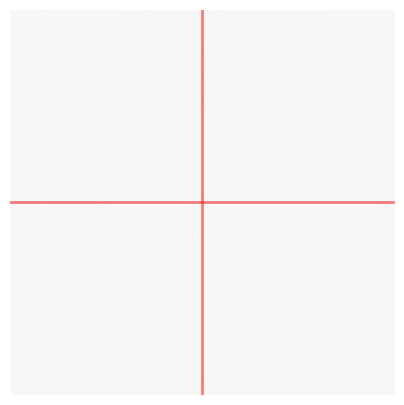

PERMUATION 6
pred_index=  7
exp_index:  6
[0.06919054 0.07629148 0.06619429 0.0629579  0.05847798 0.04818759]
mean:  0.06354996
[0.06919054 0.07629148 0.06619429 0.0629579  0.05847798 0.04818759]


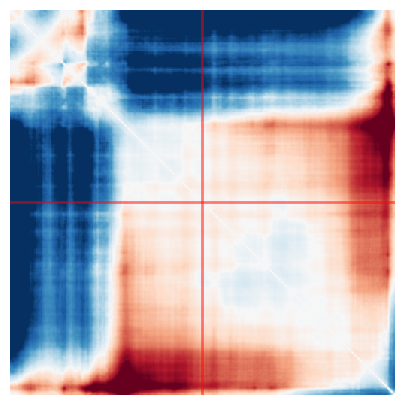

difference map


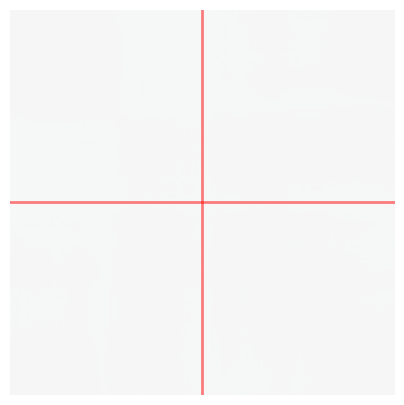

PERMUATION 7
pred_index=  8
exp_index:  7
[0.11087542 0.12256865 0.10131536 0.09682116 0.09388098 0.07833741]
mean:  0.10063317
[0.11087542 0.12256865 0.10131536 0.09682116 0.09388098 0.07833741]


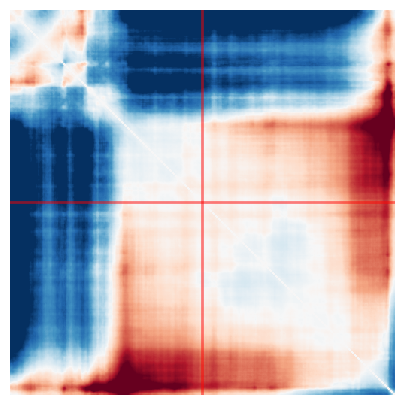

difference map


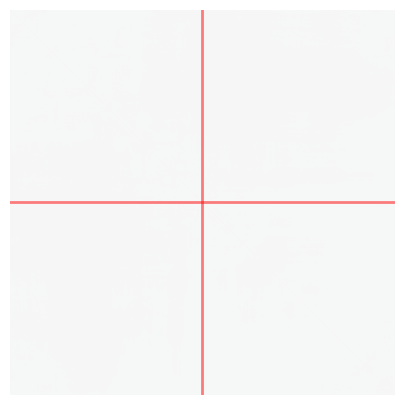

PERMUATION 8
pred_index=  9
exp_index:  8
[0.31667948 0.3678084  0.27962276 0.25986552 0.26698503 0.22331415]
mean:  0.28571257
[0.31667948 0.3678084  0.27962276 0.25986552 0.26698503 0.22331415]


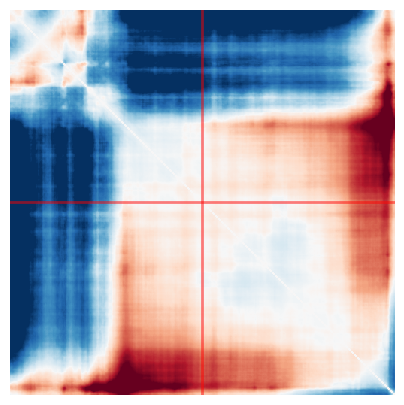

difference map


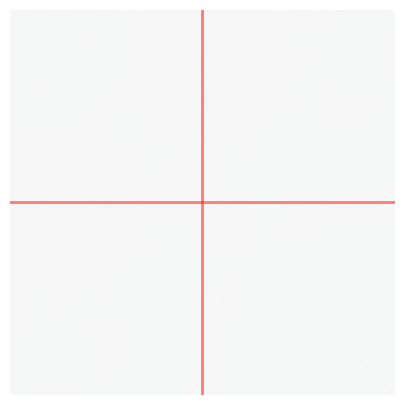

PERMUATION 9
pred_index=  10
exp_index:  9
[0.40101543 0.46314543 0.36529633 0.3446318  0.3523205  0.28915435]
mean:  0.36926064
[0.40101543 0.46314543 0.36529633 0.3446318  0.3523205  0.28915435]


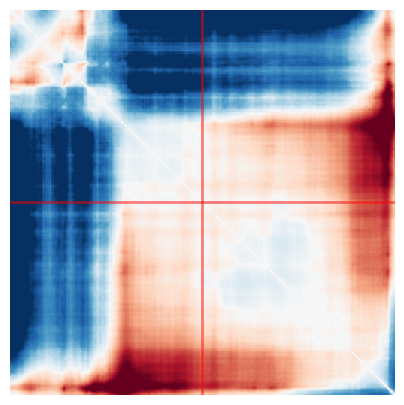

difference map


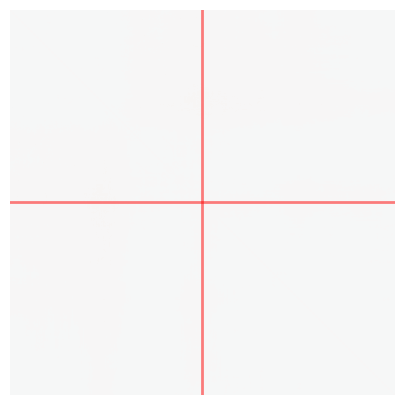

REFERENCE
pred_index=  11


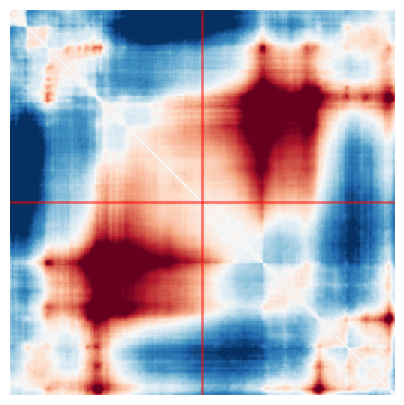

PERMUATION 0
pred_index=  12
exp_index:  10
[0.4224516  0.37976763 0.3977231  0.3865665  0.37343735 0.33565852]
mean:  0.38260078
[0.4224516  0.37976763 0.3977231  0.3865665  0.37343735 0.33565852]


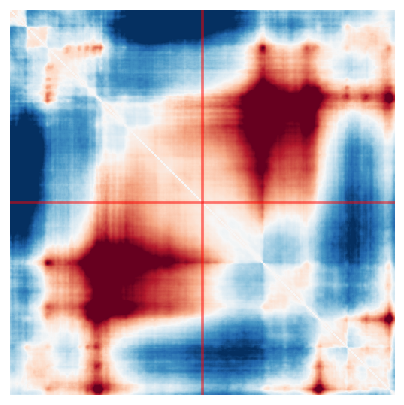

difference map


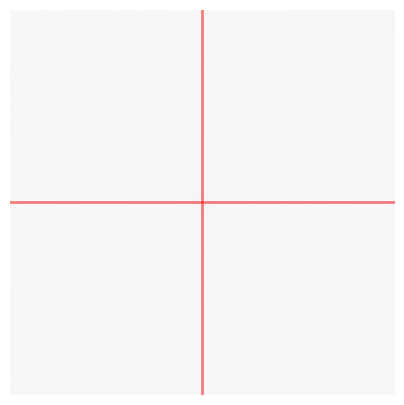

PERMUATION 1
pred_index=  13
exp_index:  11
[1.063167   0.9328573  0.9592186  0.88152194 0.842229   0.75067484]
mean:  0.9049447
[1.063167   0.9328573  0.9592186  0.88152194 0.842229   0.75067484]


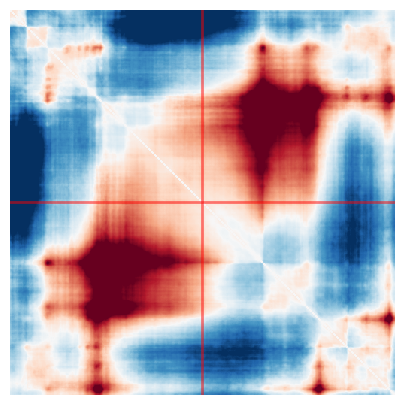

difference map


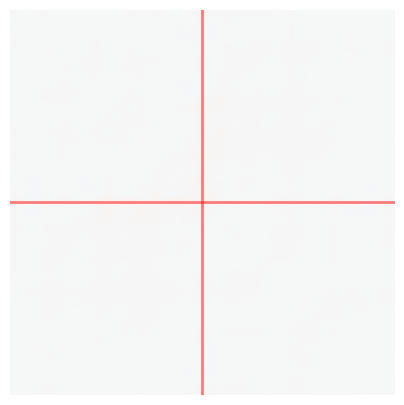

PERMUATION 2
pred_index=  14
exp_index:  12
[0.7426418  0.68067116 0.8565656  0.80100346 0.73321706 0.6593482 ]
mean:  0.74557453
[0.7426418  0.68067116 0.8565656  0.80100346 0.73321706 0.6593482 ]


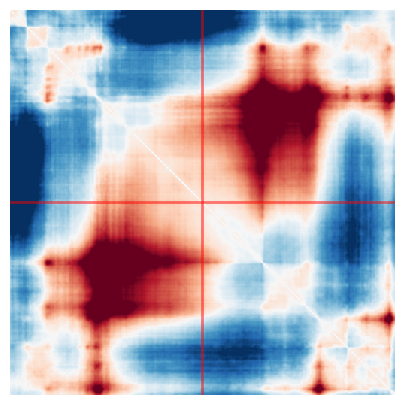

difference map


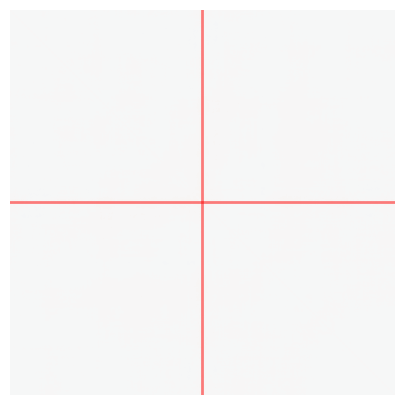

PERMUATION 3
pred_index=  15
exp_index:  13
[0.749929   0.60125405 0.45421153 0.40866116 0.437567   0.37193498]
mean:  0.5039263
[0.749929   0.60125405 0.45421153 0.40866116 0.437567   0.37193498]


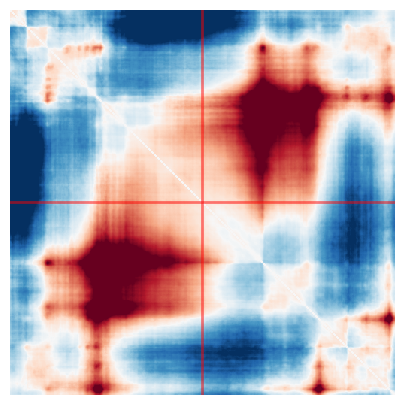

difference map


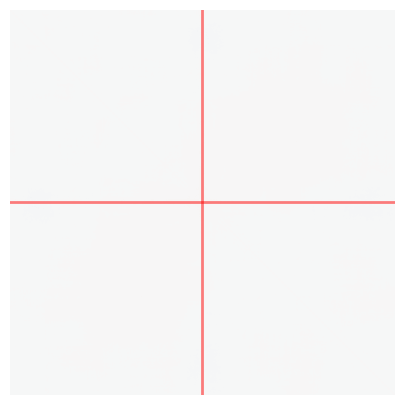

PERMUATION 4
pred_index=  16
exp_index:  14
[0.33015665 0.3248066  0.31559286 0.29396665 0.3063284  0.26703477]
mean:  0.30631432
[0.33015665 0.3248066  0.31559286 0.29396665 0.3063284  0.26703477]


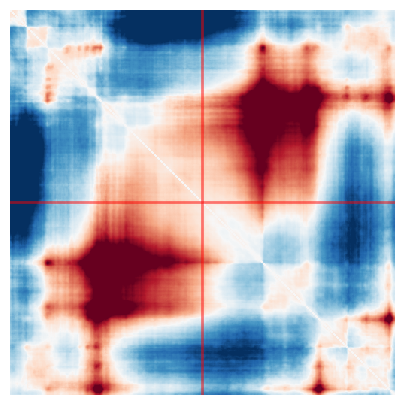

difference map


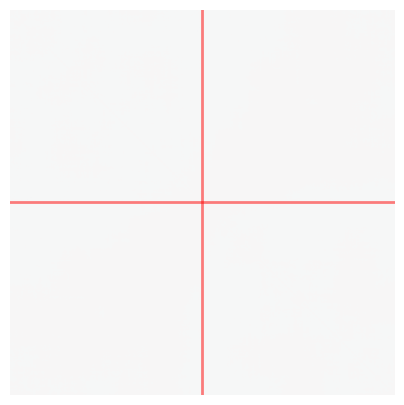

PERMUATION 5
pred_index=  17
exp_index:  15
[0.29003462 0.24763331 0.24892186 0.23065406 0.23522404 0.20813406]
mean:  0.24343365
[0.29003462 0.24763331 0.24892186 0.23065406 0.23522404 0.20813406]


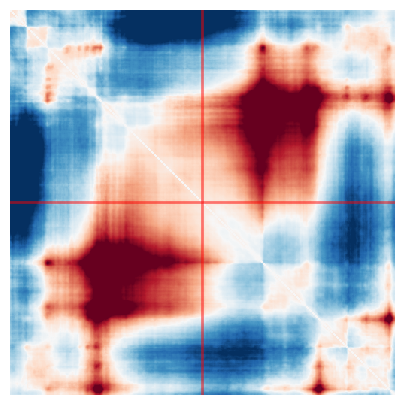

difference map


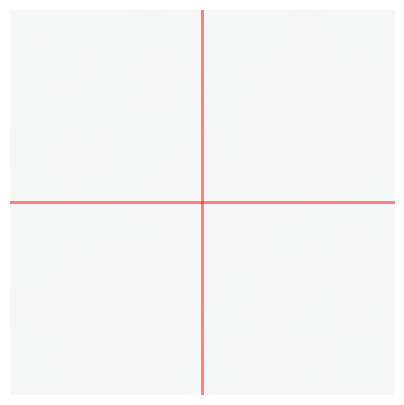

PERMUATION 6
pred_index=  18
exp_index:  16
[0.40490904 0.35187596 0.3995136  0.39157692 0.3605506  0.3271303 ]
mean:  0.37259272
[0.40490904 0.35187596 0.3995136  0.39157692 0.3605506  0.3271303 ]


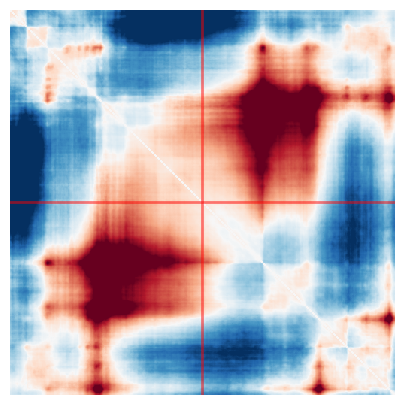

difference map


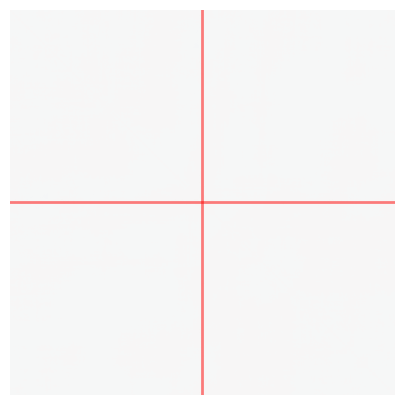

PERMUATION 7
pred_index=  19
exp_index:  17
[0.76700574 0.63656425 0.7029859  0.64270085 0.61298525 0.5425681 ]
mean:  0.6508017
[0.76700574 0.63656425 0.7029859  0.64270085 0.61298525 0.5425681 ]


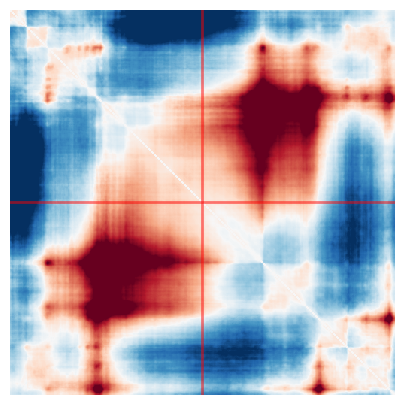

difference map


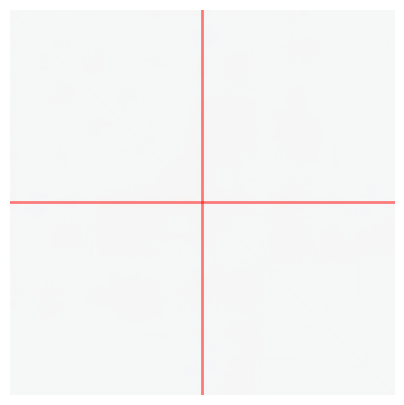

PERMUATION 8
pred_index=  20
exp_index:  18
[0.20950969 0.22649962 0.2959613  0.2826867  0.24971159 0.21983315]
mean:  0.24736701
[0.20950969 0.22649962 0.2959613  0.2826867  0.24971159 0.21983315]


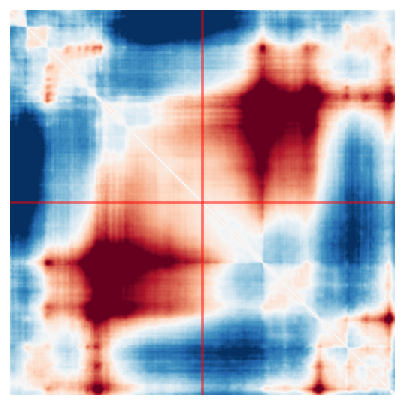

difference map


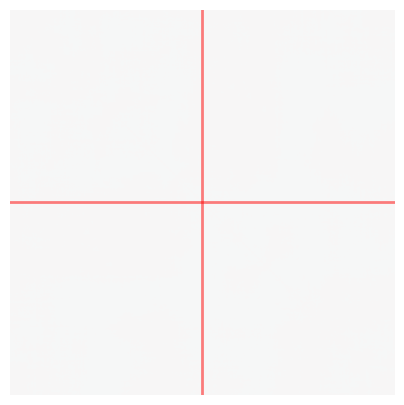

PERMUATION 9
pred_index=  21
exp_index:  19
[0.6883308  0.6544909  0.61533386 0.588642   0.5377253  0.4678083 ]
mean:  0.59205526
[0.6883308  0.6544909  0.61533386 0.588642   0.5377253  0.4678083 ]


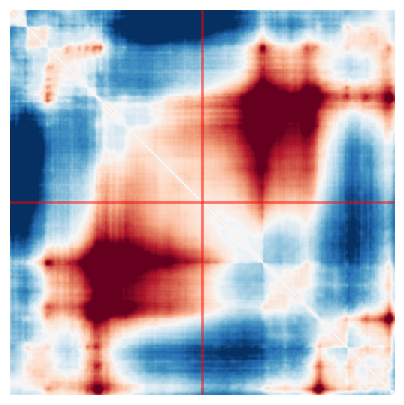

difference map


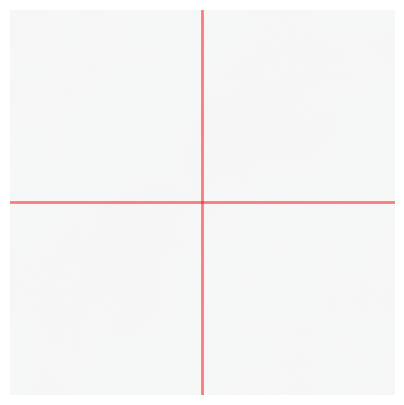

REFERENCE
pred_index=  22


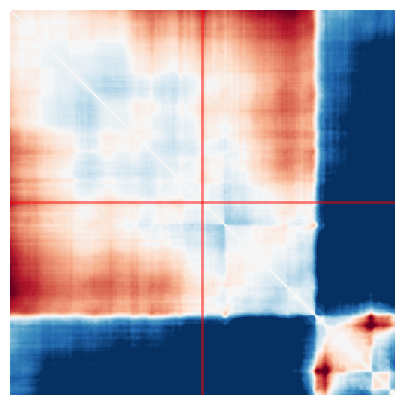

PERMUATION 0
pred_index=  23
exp_index:  20
[0.27347955 0.27115506 0.1045974  0.09700742 0.11814902 0.09699146]
mean:  0.16022998
[0.27347955 0.27115506 0.1045974  0.09700742 0.11814902 0.09699146]


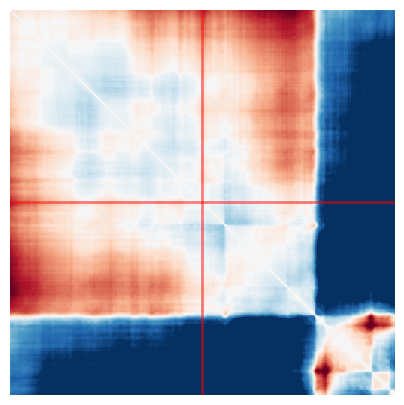

difference map


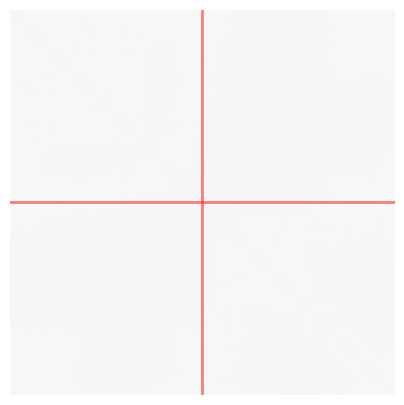

PERMUATION 1
pred_index=  24
exp_index:  21
[0.31160405 0.24009375 0.25782913 0.2470206  0.21638186 0.18244803]
mean:  0.2425629
[0.31160405 0.24009375 0.25782913 0.2470206  0.21638186 0.18244803]


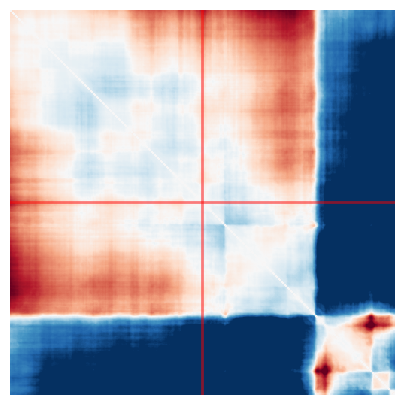

difference map


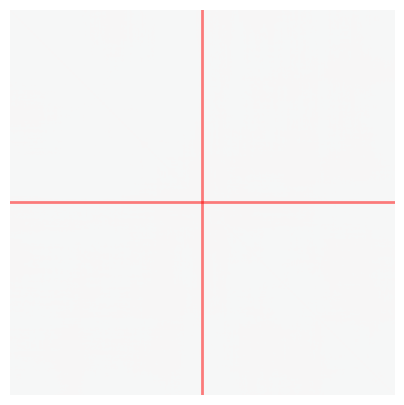

PERMUATION 2
pred_index=  25
exp_index:  22
[0.33329225 0.33838797 0.19050229 0.18797763 0.20797254 0.17838998]
mean:  0.23942046
[0.33329225 0.33838797 0.19050229 0.18797763 0.20797254 0.17838998]


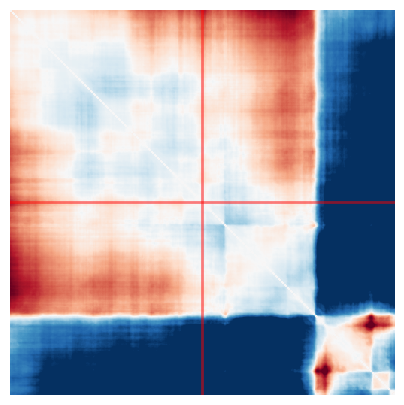

difference map


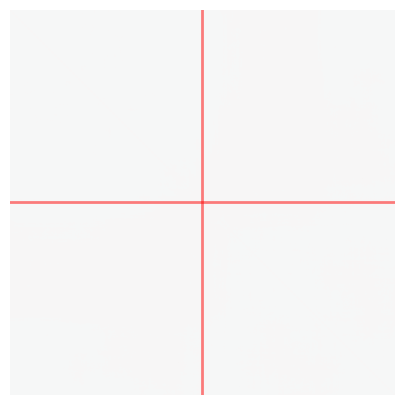

PERMUATION 3
pred_index=  26
exp_index:  23
[0.8519916  0.9655214  0.6120072  0.61094785 0.656376   0.5643207 ]
mean:  0.7101941
[0.8519916  0.9655214  0.6120072  0.61094785 0.656376   0.5643207 ]


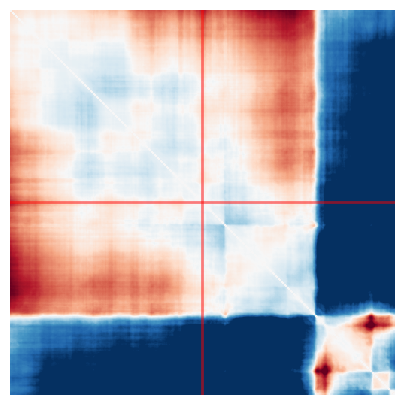

difference map


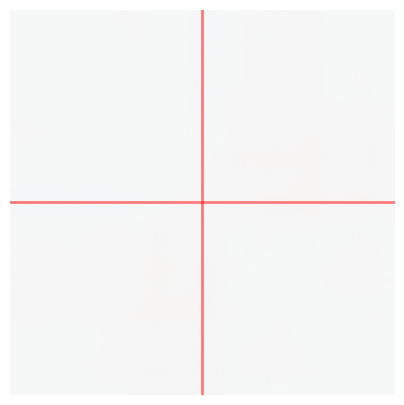

PERMUATION 4
pred_index=  27
exp_index:  24
[0.5066002  0.52636147 0.2650394  0.26751384 0.29364118 0.2550211 ]
mean:  0.35236287
[0.5066002  0.52636147 0.2650394  0.26751384 0.29364118 0.2550211 ]


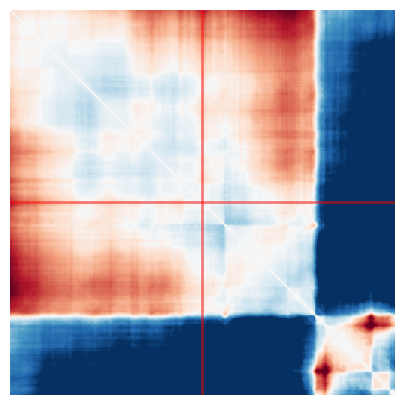

difference map


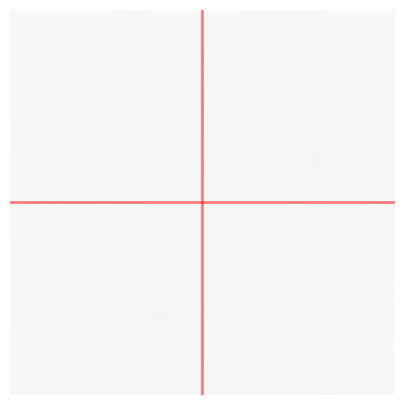

PERMUATION 5
pred_index=  28
exp_index:  25
[0.5542325  0.6204536  0.45732242 0.46378407 0.4797006  0.41219875]
mean:  0.49794865
[0.5542325  0.6204536  0.45732242 0.46378407 0.4797006  0.41219875]


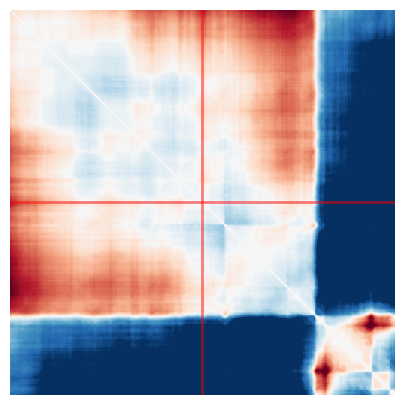

difference map


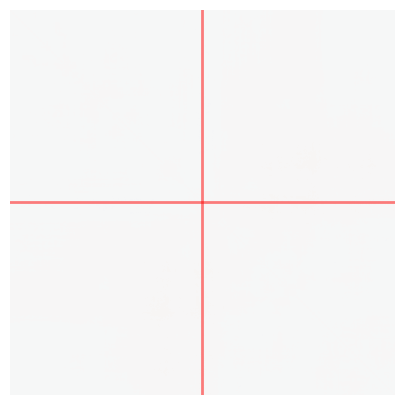

PERMUATION 6
pred_index=  29
exp_index:  26
[0.2394209  0.27217996 0.21337028 0.21240702 0.22036777 0.185145  ]
mean:  0.22381516
[0.2394209  0.27217996 0.21337028 0.21240702 0.22036777 0.185145  ]


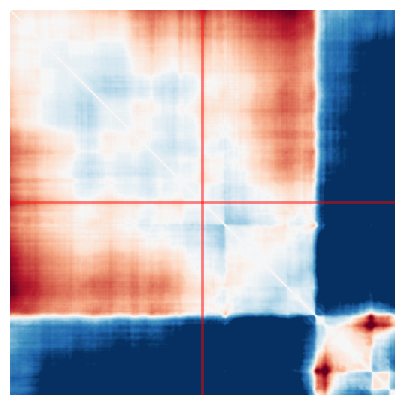

difference map


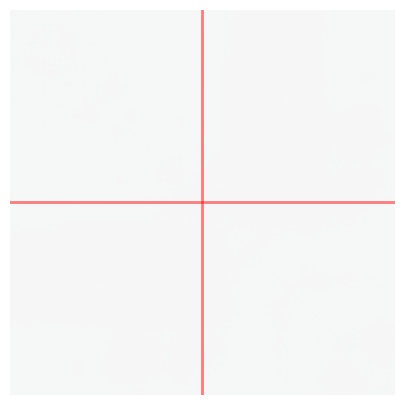

PERMUATION 7
pred_index=  30
exp_index:  27
[0.24689373 0.24322669 0.18209285 0.17143853 0.18875693 0.1527526 ]
mean:  0.19752689
[0.24689373 0.24322669 0.18209285 0.17143853 0.18875693 0.1527526 ]


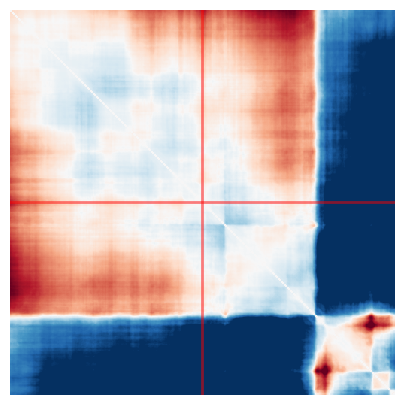

difference map


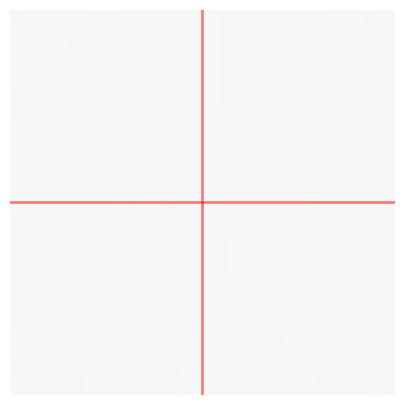

PERMUATION 8
pred_index=  31
exp_index:  28
[0.2514483  0.26810935 0.19736236 0.19710028 0.1749786  0.14945225]
mean:  0.20640852
[0.2514483  0.26810935 0.19736236 0.19710028 0.1749786  0.14945225]


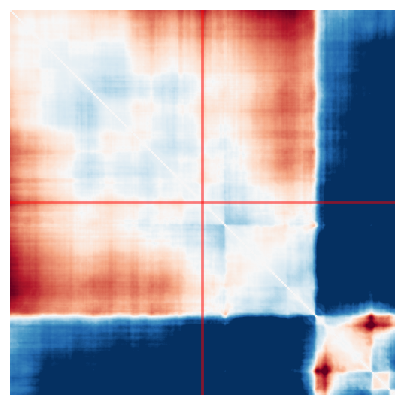

difference map


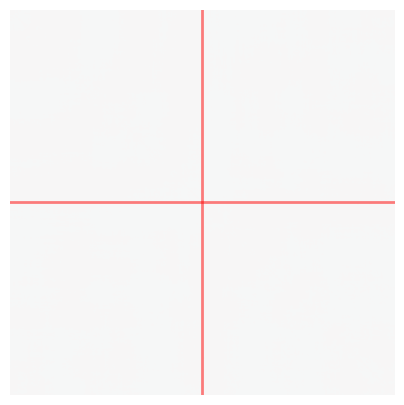

PERMUATION 9
pred_index=  32
exp_index:  29
6/6 [==============================] - 17s 3s/step
[0.3205216  0.3237058  0.23166409 0.2238637  0.23443791 0.19560283]
mean:  0.254966
[0.3205216  0.3237058  0.23166409 0.2238637  0.23443791 0.19560283]


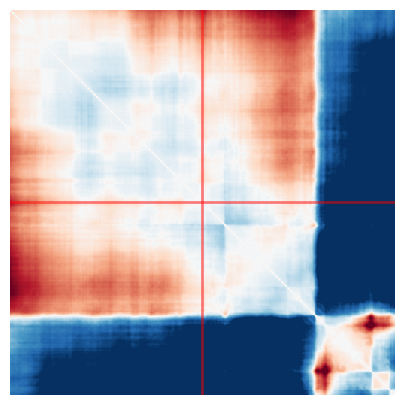

difference map


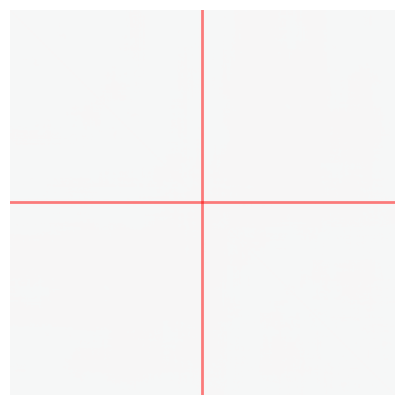

REFERENCE
pred_index=  33


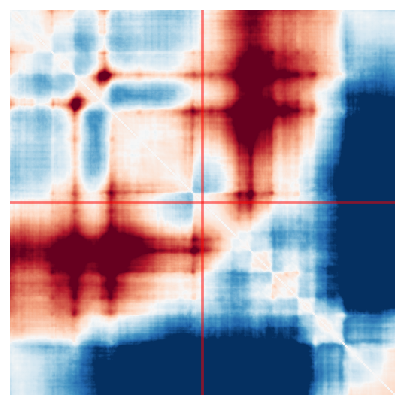

PERMUATION 0
pred_index=  34
exp_index:  30
[0.5767737  0.4842592  0.39000845 0.37049466 0.3698731  0.3228952 ]
mean:  0.41905072
[0.5767737  0.4842592  0.39000845 0.37049466 0.3698731  0.3228952 ]


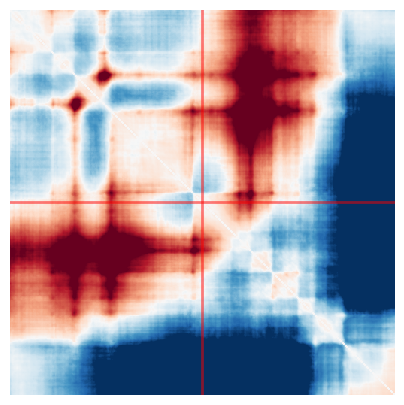

difference map


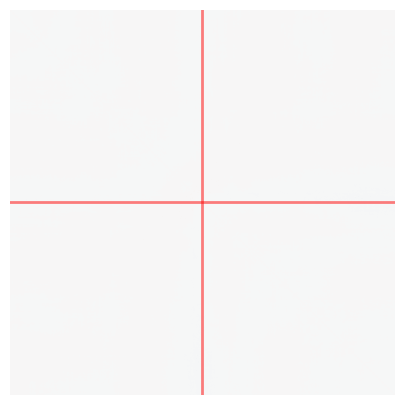

PERMUATION 1
pred_index=  35
exp_index:  31
[1.1646373 0.9982293 0.8177831 0.752493  0.7727342 0.6797628]
mean:  0.8642733
[1.1646373 0.9982293 0.8177831 0.752493  0.7727342 0.6797628]


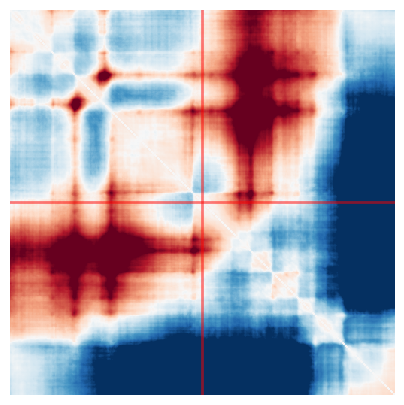

difference map


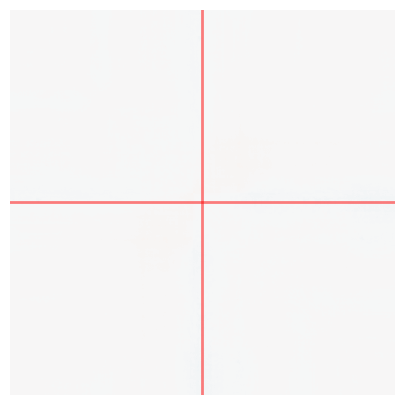

PERMUATION 2
pred_index=  36
exp_index:  32
[0.74369377 0.63945156 0.65026426 0.6197412  0.5644605  0.49660626]
mean:  0.61903626
[0.74369377 0.63945156 0.65026426 0.6197412  0.5644605  0.49660626]


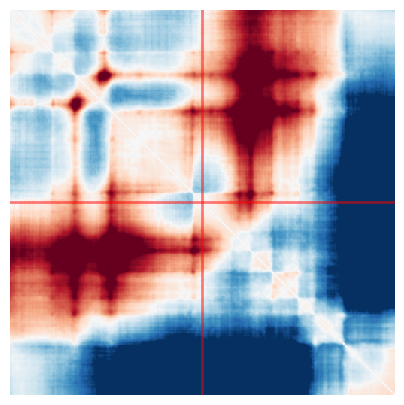

difference map


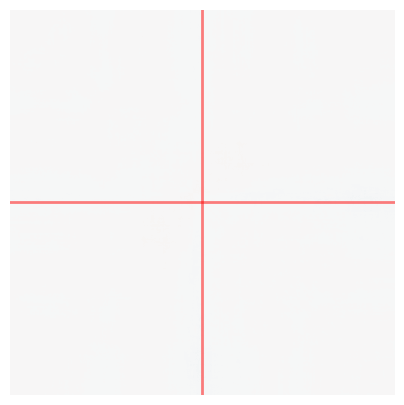

PERMUATION 3
pred_index=  37
exp_index:  33
[0.5129936  0.41497555 0.28598735 0.2718305  0.27389064 0.24339332]
mean:  0.33384514
[0.5129936  0.41497555 0.28598735 0.2718305  0.27389064 0.24339332]


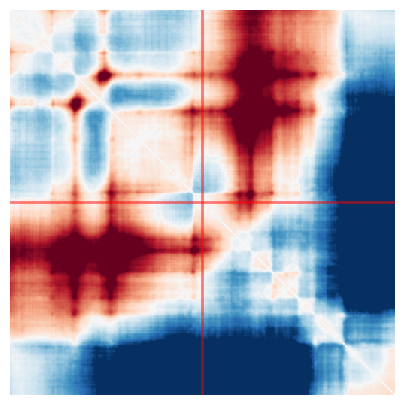

difference map


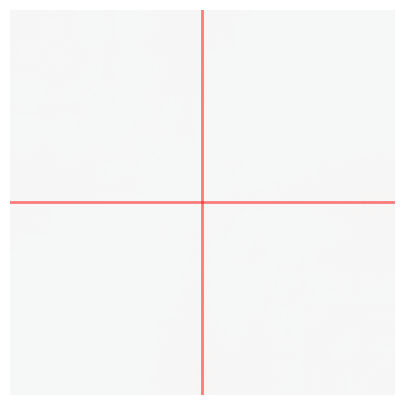

PERMUATION 4
pred_index=  38
exp_index:  34
[0.5657485  0.53003305 0.25504333 0.24273054 0.2902068  0.2505166 ]
mean:  0.35571313
[0.5657485  0.53003305 0.25504333 0.24273054 0.2902068  0.2505166 ]


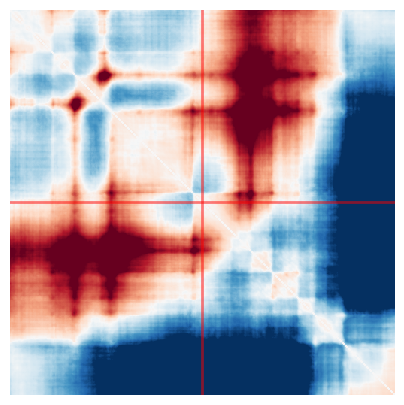

difference map


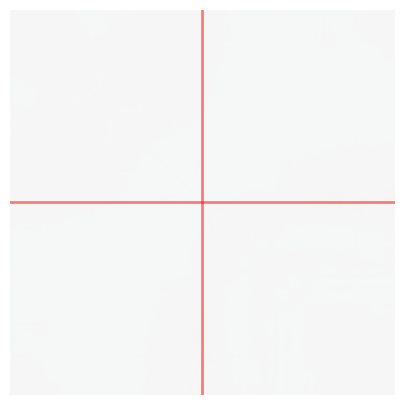

PERMUATION 5
pred_index=  39
exp_index:  35
[0.32690972 0.31353006 0.23733327 0.22682296 0.2327351  0.2015653 ]
mean:  0.25648272
[0.32690972 0.31353006 0.23733327 0.22682296 0.2327351  0.2015653 ]


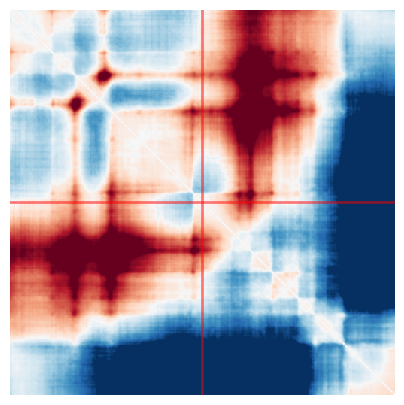

difference map


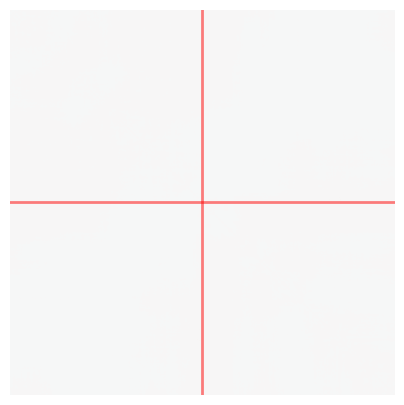

PERMUATION 6
pred_index=  40
exp_index:  36
[0.9336134  0.81765705 0.6794948  0.6473394  0.6735153  0.6063525 ]
mean:  0.7263288
[0.9336134  0.81765705 0.6794948  0.6473394  0.6735153  0.6063525 ]


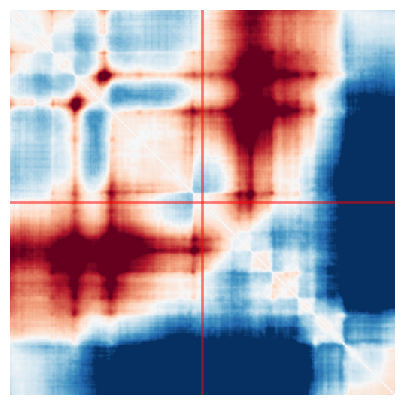

difference map


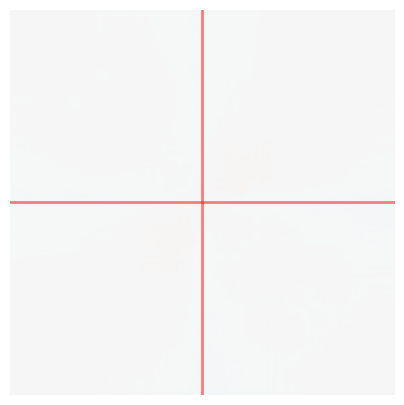

PERMUATION 7
pred_index=  41
exp_index:  37
[0.88485515 0.8304372  0.5693366  0.54077905 0.5385003  0.4754883 ]
mean:  0.63989943
[0.88485515 0.8304372  0.5693366  0.54077905 0.5385003  0.4754883 ]


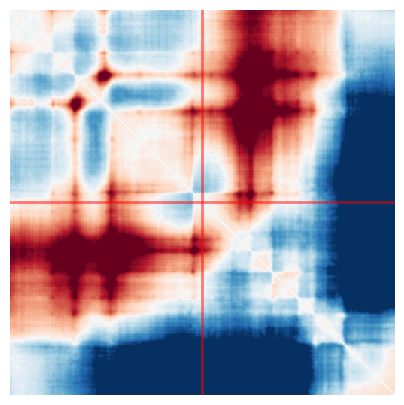

difference map


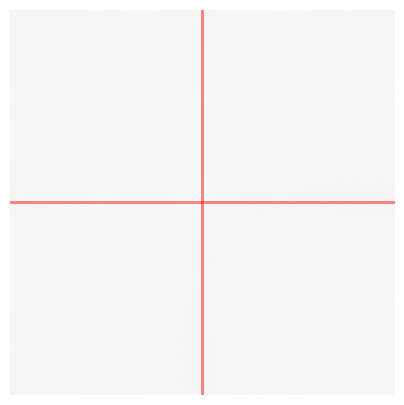

PERMUATION 8
pred_index=  42
exp_index:  38
[0.4541386  0.45754963 0.38167876 0.35478204 0.3825907  0.326686  ]
mean:  0.39290428
[0.4541386  0.45754963 0.38167876 0.35478204 0.3825907  0.326686  ]


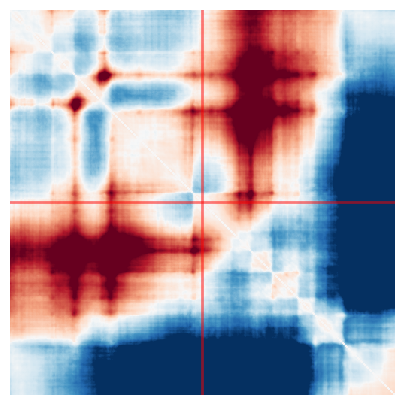

difference map


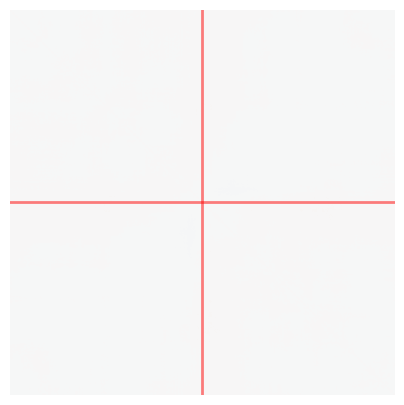

PERMUATION 9
pred_index=  43
exp_index:  39
[1.1446719  1.1985736  1.1881021  1.1039184  1.0934135  0.93335897]
mean:  1.1103398
[1.1446719  1.1985736  1.1881021  1.1039184  1.0934135  0.93335897]


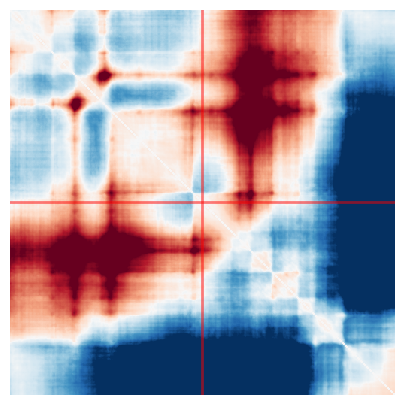

difference map


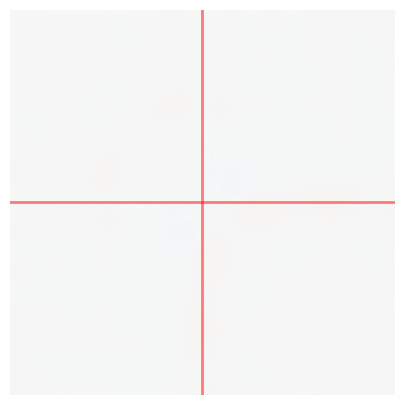

REFERENCE
pred_index=  44


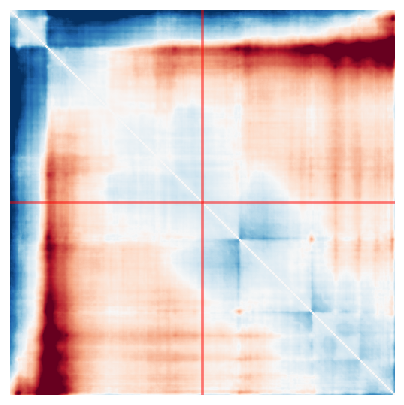

PERMUATION 0
pred_index=  45
exp_index:  40
[0.22277997 0.23224005 0.19317126 0.17067774 0.19928865 0.17133594]
mean:  0.19824892
[0.22277997 0.23224005 0.19317126 0.17067774 0.19928865 0.17133594]


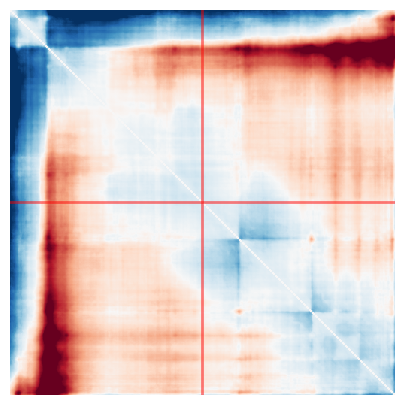

difference map


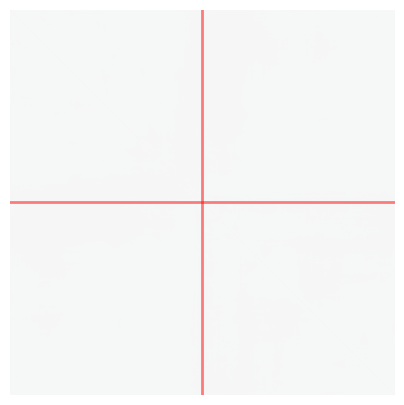

PERMUATION 1
pred_index=  46
exp_index:  41
[0.16522688 0.16827025 0.19354287 0.17417546 0.17611301 0.15210146]
mean:  0.17157166
[0.16522688 0.16827025 0.19354287 0.17417546 0.17611301 0.15210146]


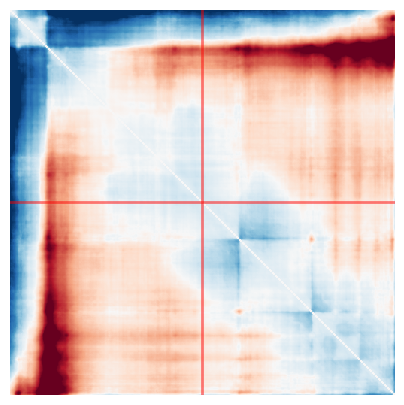

difference map


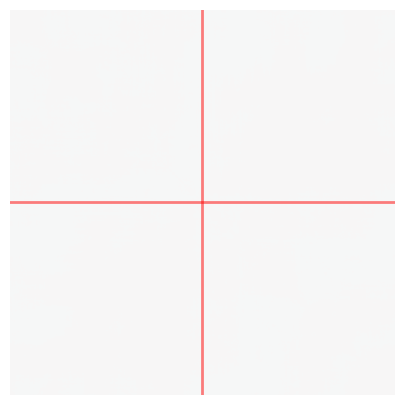

PERMUATION 2
pred_index=  47
exp_index:  42
[0.3002445  0.2732772  0.2149891  0.19921623 0.21734007 0.19281575]
mean:  0.23298049
[0.3002445  0.2732772  0.2149891  0.19921623 0.21734007 0.19281575]


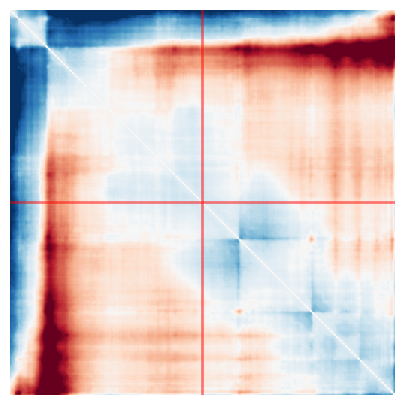

difference map


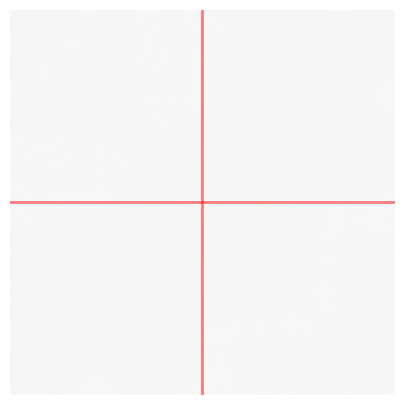

PERMUATION 3
pred_index=  48
exp_index:  43
[0.34026533 0.35156807 0.34578782 0.30931297 0.3439307  0.29655012]
mean:  0.33123586
[0.34026533 0.35156807 0.34578782 0.30931297 0.3439307  0.29655012]


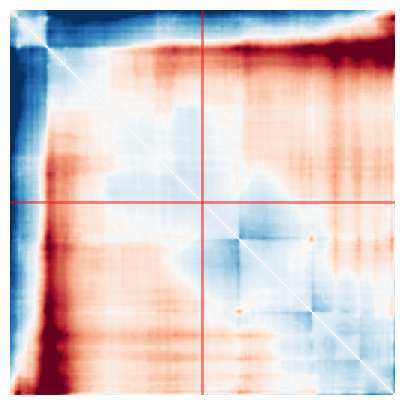

difference map


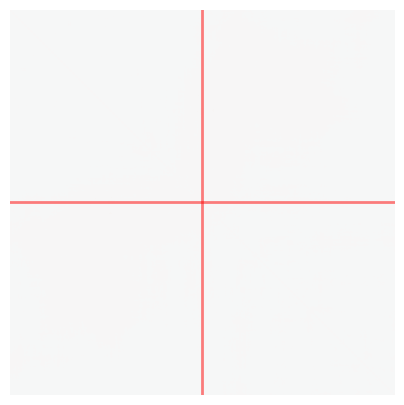

PERMUATION 4
pred_index=  49
exp_index:  44
[0.21106057 0.21628837 0.17167266 0.15208916 0.18370491 0.15771881]
mean:  0.18208909
[0.21106057 0.21628837 0.17167266 0.15208916 0.18370491 0.15771881]


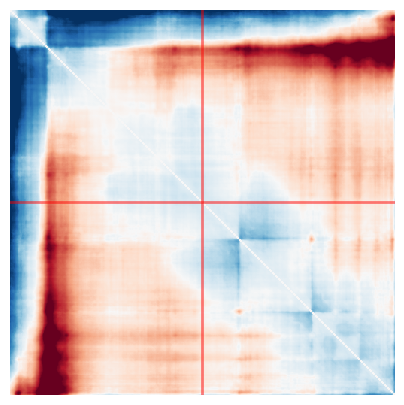

difference map


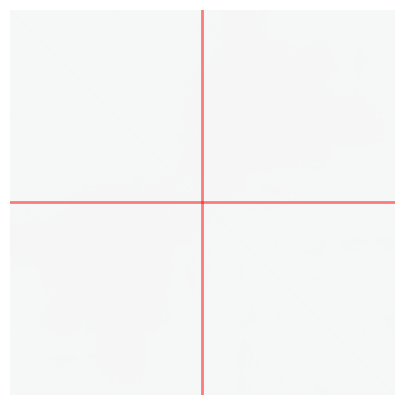

PERMUATION 5
pred_index=  50
exp_index:  45
[0.40070435 0.38665777 0.462885   0.40686455 0.44056973 0.38519824]
mean:  0.41381326
[0.40070435 0.38665777 0.462885   0.40686455 0.44056973 0.38519824]


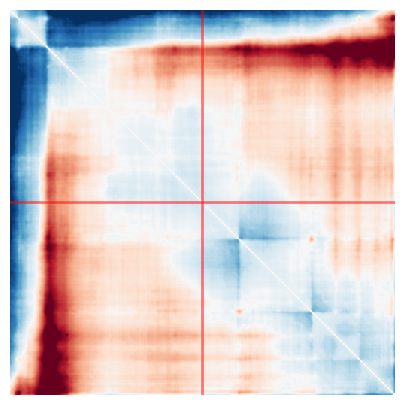

difference map


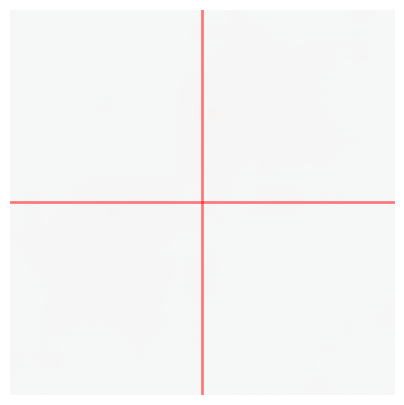

PERMUATION 6
pred_index=  51
exp_index:  46
[0.3769558  0.38013762 0.36262462 0.3273578  0.35777396 0.31164825]
mean:  0.35274968
[0.3769558  0.38013762 0.36262462 0.3273578  0.35777396 0.31164825]


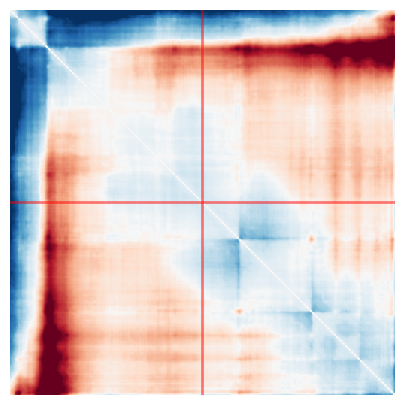

difference map


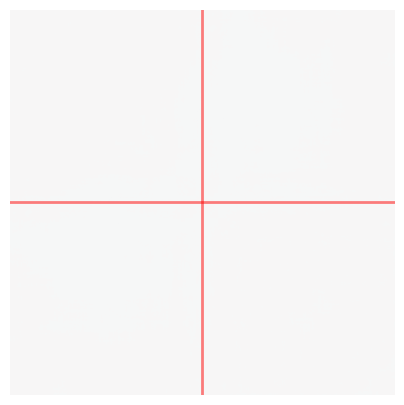

PERMUATION 7
pred_index=  52
exp_index:  47
[0.47785994 0.49961838 0.5174418  0.4536149  0.50872076 0.4435177 ]
mean:  0.48346224
[0.47785994 0.49961838 0.5174418  0.4536149  0.50872076 0.4435177 ]


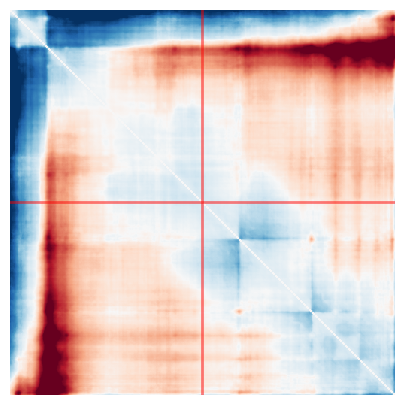

difference map


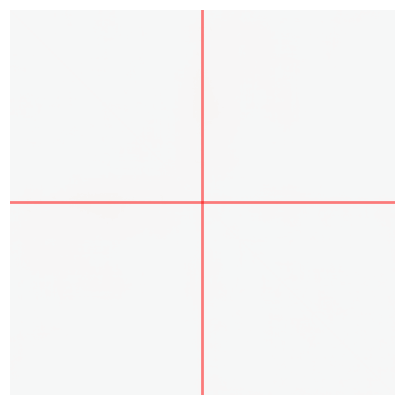

PERMUATION 8
pred_index=  53
exp_index:  48
[0.6185135  0.63491464 0.6554169  0.56490844 0.6269647  0.5420847 ]
mean:  0.60713387
[0.6185135  0.63491464 0.6554169  0.56490844 0.6269647  0.5420847 ]


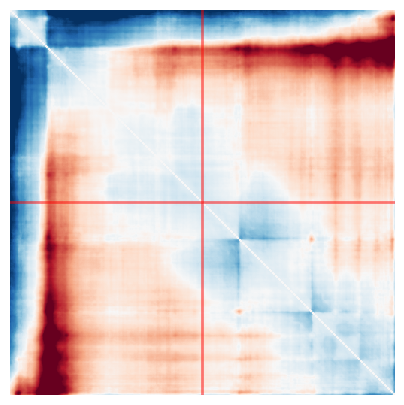

difference map


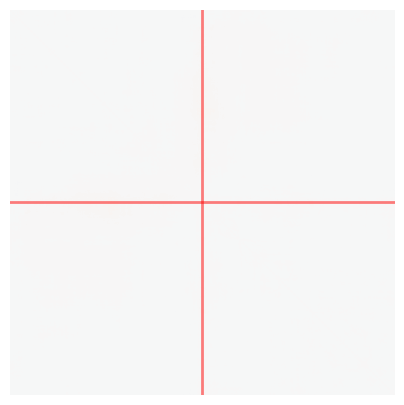

PERMUATION 9
pred_index=  54
exp_index:  49
[0.19791052 0.1967565  0.20080878 0.17982028 0.19235508 0.16978708]
mean:  0.18957305
[0.19791052 0.1967565  0.20080878 0.17982028 0.19235508 0.16978708]


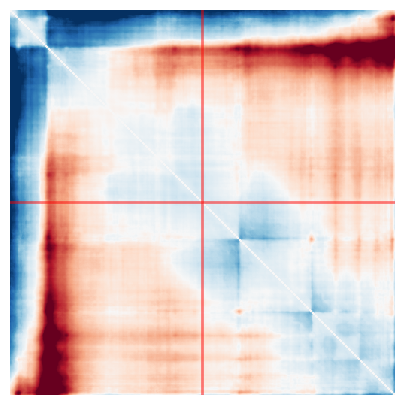

difference map


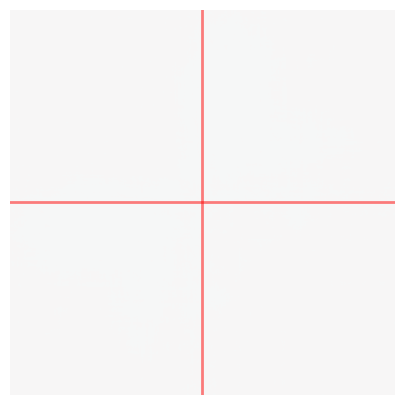

REFERENCE
pred_index=  55


ValueError: Expected input data to be non-empty.

In [41]:
exp_index = 0

# for pred_index in range(num_preds):
for pred_index in range(110):
    if pred_index % (split+1) == 0:
        # only wild types
        print("REFERENCE")
        print("pred_index= ", pred_index)
        ref_preds_matrix = preds_stream[pred_index]
        ref_map = ut_dense(ref_preds_matrix, diagonal_offset=2)
        plot_map(ref_map[:,:,1])
        # restart counting permutations
        perm_index = 0
    else:
        print("PERMUATION", perm_index)
        print("pred_index= ", pred_index)
        perm_index += 1 

        print("exp_index: ", exp_index)
        
        permuted_preds_matrix = preds_stream[pred_index]
        permuted_map = ut_dense(permuted_preds_matrix, diagonal_offset=2)
        scd = calculate_SCD(permuted_map, ref_map)
        scd_mean = np.mean(scd)
        SCD_list.append(scd_mean)
        print(scd)
        print("mean: ", scd_mean)
        print(scd)
        plot_map(permuted_map[:,:,1])
        print("difference map")
        plot_map(permuted_map[:,:,1]-ref_map[:,:,1])
        
        # write_stat_metrics_to_h5(
        #         permuted_preds_matrix,
        #         ref_preds_matrix,
        #         stats_out,
        #         exp_index,
        #         head_index,
        #         model_index,
        #         diagonal_offset=2,
        #         stat_metrics=stats,
        #     )
        exp_index += 1

In [ ]:
plt.plot(SCD_list)

In [ ]:
plt.scatter(y=SCD_list, x=[i for i in range(1000)])

In [ ]:
for key in stats_out:
    print(key)

In [ ]:
stats_out["SCD_h1_m0"][1]

In [ ]:
stats_out.close()

In [ ]:
genome_open.close()